## Study 1

## Install Bioconductor packages 
https://www.bioconductor.org/install/

In [1]:
if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
install.packages("pheatmap")
BiocManager::install(version = "3.18")
BiocManager::install(c("edgeR", "ggplot2", "DESeq2", "rtracklayer", "GenomicRanges"))
library(ggplot2)
library(edgeR)
library (DESeq2)
library(rtracklayer)
library(pheatmap)
library(GenomicRanges)

Bioconductor version '3.18' is out-of-date; the current release version '3.20'
  is available with R version '4.4'; see https://bioconductor.org/install

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.r-project.org

Bioconductor version 3.18 (BiocManager 1.30.25), R 4.3.3 (2024-02-29)

Old packages: 'askpass', 'backports', 'bit', 'bit64', 'bitops', 'broom',
  'bslib', 'caret', 'class', 'cli', 'clock', 'colorspace', 'commonmark',
  'cpp11', 'crayon', 'credentials', 'curl', 'data.table', 'DBI', 'dials',
  'downlit', 'e1071', 'evaluate', 'fontawesome', 'forecast', 'fs', 'future',
  'future.apply', 'gert', 'gower', 'gtable', 'hardhat', 'hexbin', 'highr',
  'httr2', 'ipred', 'jsonlite', 'KernSmooth', 'knitr', 'later', 'lava', 'lhs',
  'lubridate', 'modeldata', 'modelenv', 'nlme', 

## Read in the counts and meta data

In [2]:
######## Read in raw count file ########
raw_cnts = read.csv("GSE288288_study1_genesRawCounts.csv", header=TRUE, sep="\t", row.names=1)
head(raw_cnts)
dim(raw_cnts)

,POU2F3_KO_F04_GT23.10504_GGTACCTT.GACGTCTT_S33_L001,PPARG_PTC_A10_GT23.11454_GCAATGCA.AACGTTCC_S54_L002,GCM1_PTC_A11_GT23.11442_CGTTAGAA.GACCTGAA_S52_L002,GCM1_CE_G6_GT23.11440_AATGCCTC.TGGATCGA_S59_L002,FOSB_CE_C05_GT23.10483_TTATAACC.TCGATATC_S27_L001,PPARG_KO_E02_GT23.11448_CGGACAAC.AATCCGGA_S60_L002,PPARG_CE_D08_GT23.11451_AAGATACT.ATGTAAGT_S61_L002,CE_G07__Normoxia_GT23.11295_TGGATCGA.TATCGCAC_S25_L001,PPARG_WT_1_GT23.11445_TCGTAGTG.CCAAGTCT_S43_L002,POU2F3_PTC_A10_GT23.10510_CTTGGTAT.GGACTTGG_S42_L001,⋯,GRHL1_KO_G04_GT23.10495_CTCTCGTC.AGGTTATA_S15_L001,ISL1_CE_D01_GT23.12152_TGCGGCGT.TACCGAGG_S15_L001,CE_H06__Normoxia_GT23.11296_AGTTCAGG.TCTGTTGG_S20_L001,KO_A03__Hypoxia_GT23.11303_TGACGAAT.GCCTACTG_S33_L001,GCM1_CE_D6_GT23.11439_GGCATTCT.CAAGCTAG_S49_L002,PTC_G09__Normoxia_GT23.11299_CTCTCGTC.AGGTTATA_S23_L001,FOSB_CE_D07_GT23.10484_GGACTTGG.CGTCTGCG_S22_L001,FOSB_KO_C02_GT23.10489_TGGATCGA.TATCGCAC_S1_L001,PTC_A09__Hypoxia_GT23.11309_AACGTTCC.AGTACTCC_S30_L001,PTC_D10__Hypoxia_GT23.11310_GCAGAATT.TGGCCGGT_S22_L001
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000268674,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000271254,1029.820,745.396,1168.72,1081.170,874.138,866.846,710.329,760.579,841.388,964.798,⋯,515.27,833.324,723.085,476.747,994.952,754.079,746.362,805.504,488.888,602.677
ENSG00000275063,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000277856,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000276345,1.728,0.000,0.00,2.671,0.000,0.000,0.000,0.000,0.000,0.000,⋯,1.99,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000278633,0.000,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


[1] 38592    90

In [3]:
######## Read in metadata file ########
meta_data = read.csv("metadata_study1.csv", header=TRUE, stringsAsFactors=FALSE)
head(meta_data)
dim(meta_data)

,GEO.Accession,Sample,Type,Gene,Scheme
,<chr>,<chr>,<chr>,<chr>,<chr>
1,GSM8763618,GRHL1_KO_D02_GT23-10494_TCTCTACT-GAACCGCG_S26,KO,GRHL1,primitive syncytium formation
2,GSM8763619,GRHL1_KO_G04_GT23-10495_CTCTCGTC-AGGTTATA_S15,KO,GRHL1,primitive syncytium formation
3,GSM8763620,GRHL1_KO_H04_GT23-10496_CCAAGTCT-TCATCCTT_S35,KO,GRHL1,primitive syncytium formation
4,GSM8763621,GRHL1_CE_A05_GT23-10497_TTGGACTC-CTGCTTCC_S12,CE,GRHL1,primitive syncytium formation
5,GSM8763622,GRHL1_CE_A08_GT23-10498_CAGTAGGC-ATTCGTCA_S39,CE,GRHL1,primitive syncytium formation
6,GSM8763623,GRHL1_CE_D07_GT23-10499_TGACGAAT-GCCTACTG_S31,CE,GRHL1,primitive syncytium formation


[1] 90  5

In [5]:
rownames(meta_data) = meta_data$Sample
# trim the ends 
colnames(raw_cnts) <- gsub("_L\\d{3}$", "", colnames(raw_cnts))
# replace dot (.) to hyphen (-)
colnames(raw_cnts) <- gsub("\\.", "-", colnames(raw_cnts))
table(rownames(meta_data) %in% colnames(raw_cnts))
raw_cnts = raw_cnts[,rownames(meta_data)]
dim(raw_cnts)
dim(meta_data)
head(raw_cnts)
head(meta_data)


TRUE 
  90 

[1] 38592    90

[1] 90  5

,GRHL1_KO_D02_GT23-10494_TCTCTACT-GAACCGCG_S26,GRHL1_KO_G04_GT23-10495_CTCTCGTC-AGGTTATA_S15,GRHL1_KO_H04_GT23-10496_CCAAGTCT-TCATCCTT_S35,GRHL1_CE_A05_GT23-10497_TTGGACTC-CTGCTTCC_S12,GRHL1_CE_A08_GT23-10498_CAGTAGGC-ATTCGTCA_S39,GRHL1_CE_D07_GT23-10499_TGACGAAT-GCCTACTG_S31,GRHL1_PTC_A09_GT23-10500_TAATACAG-GTGAATAT_S2,GRHL1_PTC_A10_GT23-10501_CGGCGTGA-ACAGGCGC_S30,GRHL1_PTC_C09_GT23-10502_ATGTAAGT-CATAGAGT_S19,KOLF2_GRHL1_2_GT23-10492_TTACAGGA-GCTTGTCA_S6,⋯,ISL1_KO_F04_GT23-12149_TGGTGGCA-TTACAGGA_S17,ISL1_CE_A06_GT23-12150_GTTCGCCG-CAATGAGC_S24,ISL1_CE_B05_GT23-12151_CACGAGCG-TGGCAGAT_S27,ISL1_CE_D01_GT23-12152_TGCGGCGT-TACCGAGG_S15,ISL1_PTC_A10_GT23-12153_CATAATAC-CGTTAGAA_S20,ISL1_PTC_C12_GT23-12154_GATCTATC-AGCCTCAT_S21,ISL1_PTC_D10_GT23-12155_AGCTCGCT-GATTCTGC_S32,ISL1_WT_1_GT23-12144_ATATCTCG-ACTAAGAT_S33,ISL1_WT_2_GT23-12145_GCGCTCTA-GTCGGAGC_S29,ISL1_WT_3_GT23-12146_AACAGGTT-CTTGGTAT_S23
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000268674,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000271254,654.071,515.27,633.038,639.855,933.543,667.218,736.296,522.558,529.378,744.691,⋯,902.267,867.455,841.784,833.324,809.884,814.691,656.442,795.703,731.433,633.776
ENSG00000275063,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000277856,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000276345,0.000,1.99,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
ENSG00000278633,0.000,0.00,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.500,0.000,0.000,0.000,0.000,0.000


,GEO.Accession,Sample,Type,Gene,Scheme
,<chr>,<chr>,<chr>,<chr>,<chr>
GRHL1_KO_D02_GT23-10494_TCTCTACT-GAACCGCG_S26,GSM8763618,GRHL1_KO_D02_GT23-10494_TCTCTACT-GAACCGCG_S26,KO,GRHL1,primitive syncytium formation
GRHL1_KO_G04_GT23-10495_CTCTCGTC-AGGTTATA_S15,GSM8763619,GRHL1_KO_G04_GT23-10495_CTCTCGTC-AGGTTATA_S15,KO,GRHL1,primitive syncytium formation
GRHL1_KO_H04_GT23-10496_CCAAGTCT-TCATCCTT_S35,GSM8763620,GRHL1_KO_H04_GT23-10496_CCAAGTCT-TCATCCTT_S35,KO,GRHL1,primitive syncytium formation
GRHL1_CE_A05_GT23-10497_TTGGACTC-CTGCTTCC_S12,GSM8763621,GRHL1_CE_A05_GT23-10497_TTGGACTC-CTGCTTCC_S12,CE,GRHL1,primitive syncytium formation
GRHL1_CE_A08_GT23-10498_CAGTAGGC-ATTCGTCA_S39,GSM8763622,GRHL1_CE_A08_GT23-10498_CAGTAGGC-ATTCGTCA_S39,CE,GRHL1,primitive syncytium formation
GRHL1_CE_D07_GT23-10499_TGACGAAT-GCCTACTG_S31,GSM8763623,GRHL1_CE_D07_GT23-10499_TGACGAAT-GCCTACTG_S31,CE,GRHL1,primitive syncytium formation


In [6]:
# Convert floating-point values to integers
raw_cnts <- round(raw_cnts) 

In [7]:
# Convert meta_data from char to factor
meta_data$Type <- as.factor(meta_data$Type)
table(meta_data$Type)


 CE  KO PTC  WT 
 24  24  24  18 

In [8]:
# Should return TRUE 
all(rownames(meta_data) == colnames(raw_cnts))  

[1] TRUE

In [9]:
# Create a DESeq2 dataset from raw counts and sample metadata
dds <- DESeqDataSetFromMatrix(countData = raw_cnts,
                              colData = meta_data, #
                              design = ~ Type)  # WT, KO, PTC, CE

# Pre-filtering https://bioconductor.org/packages/3.21/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#quick-start
smallestGroupSize <- 3
keep <- rowSums(counts(dds) >= 10) >= smallestGroupSize
dds <- dds[keep,]

# Set reference level to WT
dds$Type <- relevel(dds$Type, ref="WT")

converting counts to integer mode



In [10]:
# Run DESeq analysis on dds
dds <- DESeq(dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 433 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [11]:
res_PTC_vs_WT <- results(dds, contrast = c("Type", "PTC", "WT"))
res_KO_vs_WT <- results(dds, contrast = c("Type", "KO", "WT"))
res_CE_vs_WT <- results(dds, contrast = c("Type", "CE", "WT"))
summary(res)


out of 18947 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 52, 0.27%
LFC < 0 (down)     : 72, 0.38%
outliers [1]       : 0, 0%
low counts [2]     : 1, 0.0053%
(mean count < 0)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [12]:
# Filter out significantly differentiated genes (p=value < .05 and log2FoldChange > 1 or < -1
res_sig <- subset(res_KO_vs_WT, padj < 0.05 & abs(log2FoldChange) > 1)

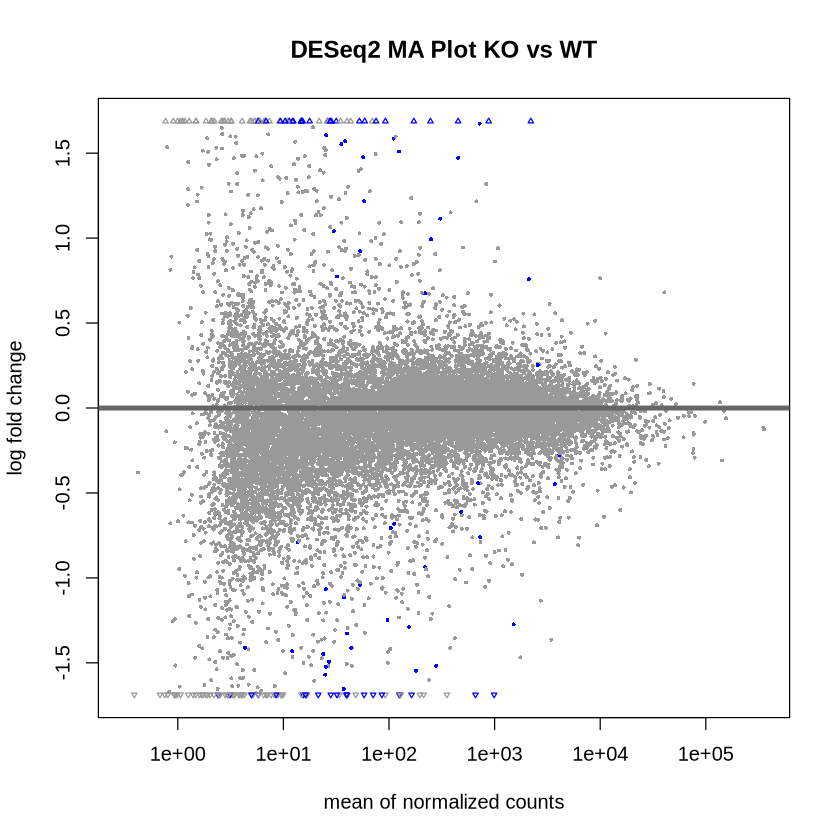

In [13]:
# Create an MA plot
plotMA(res_KO_vs_WT, main="DESeq2 MA Plot KO vs WT")

Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


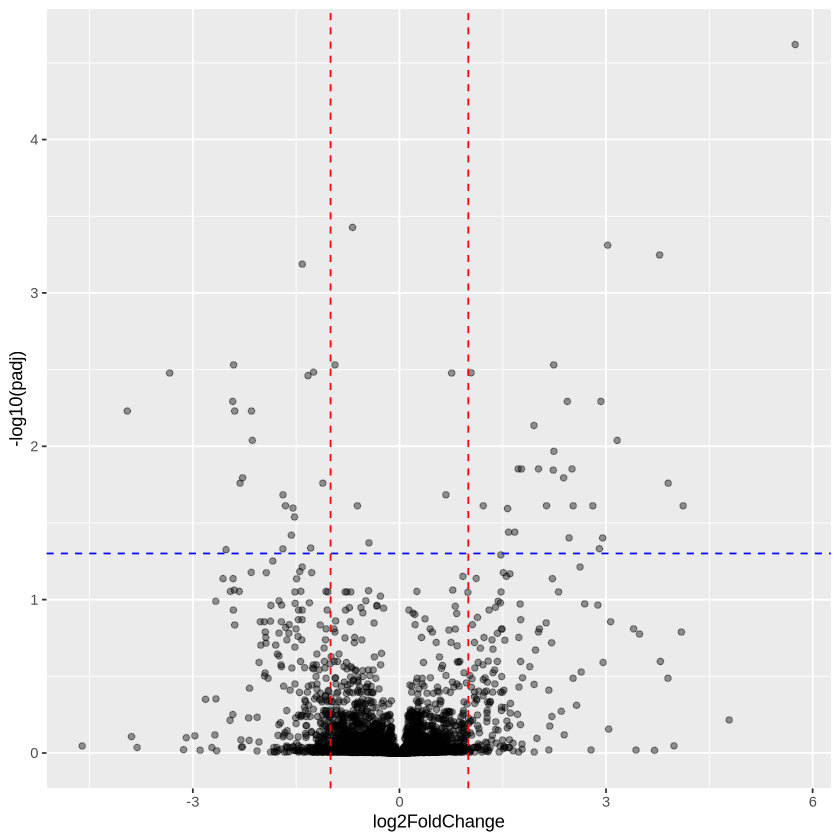

In [14]:
# Create a volcano plot
library(ggplot2)
ggplot(as.data.frame(res_KO_vs_WT), aes(x=log2FoldChange, y=-log10(padj))) +
    geom_point(alpha=0.4) +
    geom_vline(xintercept=c(-1,1), linetype="dashed", color="red") +
    geom_hline(yintercept=-log10(0.05), linetype="dashed", color="blue")

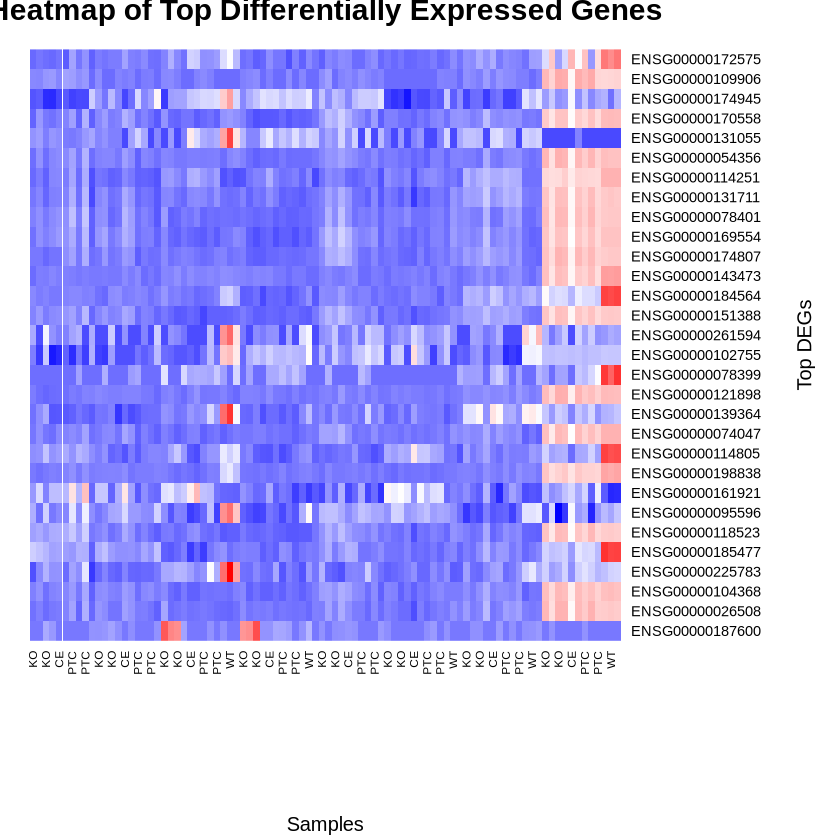

In [15]:
# Heatmap of Top DEGs
# Extract top differentially expressed genes
top_degs <- rownames(head(res_sig[order(res_sig$padj), ], 30))

# Normalize counts using variance stabilizing transformation (VST)
vsd <- vst(dds, blind=FALSE)

# Subset for top differentially expressed genes
norm_counts <- assay(vsd)[top_degs, ]

# Ensure column names match metadata
colnames(norm_counts) <- meta_data$Type

# Define colors for heatmap
heat_colors <- colorRampPalette(c("blue", "white", "red"))(256)

# Plot heatmap
heatmap(norm_counts, 
        scale="row",              # Standardize rows (genes)
        Colv=NA, Rowv=NA,         # No hierarchical clustering
        col=heat_colors,          # Color gradient
        margins=c(10,10),         # Adjust margins
        xlab="Samples", 
        ylab="Top DEGs", 
        main="Heatmap of Top Differentially Expressed Genes")
